In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
import networkit as nk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances
from IPython.display import display, Math, Latex, Markdown
from tqdm.notebook import tqdm
from numpy.linalg import norm

from External.ICT.calculate_ICT import calculate_ICT, compute_widths
from External.clustering import k_means_pp, centers
from External.generation import create_graph
from External.plotting import plot_points, plot_graph, no_intersections
from External.data_loader import data_loader
from External.ICT.reduce_to_mst import MST
from External.create_k_nearest import patch_together



plt.style.use('standard.mplstyle')

cv2 package not present. No movies possible


In [5]:
# Hyperparameters
mode = "K_Nearest+Density2"
metric = "euclidean"
dataset = "eth_CC"

threshold = 6

# for the filename
parameters = "2-0_5-t6"

In [6]:
start = time.time()

# load the dataset & UMAP embedding (if dim > 2, othervise embedding=position)
position, labels, embedding = data_loader(dataset, True)

# calculate the clusters
if len(position[0]) > 500:
    pca = PCA(n_components=100).fit_transform(StandardScaler().fit_transform(position))
else:
    pca = StandardScaler().fit_transform(position)

################################
###   apply the fitltering   ###
################################
from cluster_filter import cfilter
number_of_nodes = len(position)
ε, δ = 0.03, 0.1
r = 1 / (ε**2) * (int(np.log2(number_of_nodes - 1)) + 1 + np.log(1/δ))
k = int(np.sqrt(r))
k = np.min((k, number_of_nodes))

cluster_centers, labels, position, pca, embedding = cfilter(*k_means_pp(k, pca, return_labels=True), position, pca, embedding)
number_of_nodes = len(pca)
################################
unique_labels = np.unique(labels)


print("Time for data preperation: ", time.time()-start)

sklearn is done: 26.09005904197693
My own part is done: 0.6365721225738525
Time for data preperation:  92.34918260574341


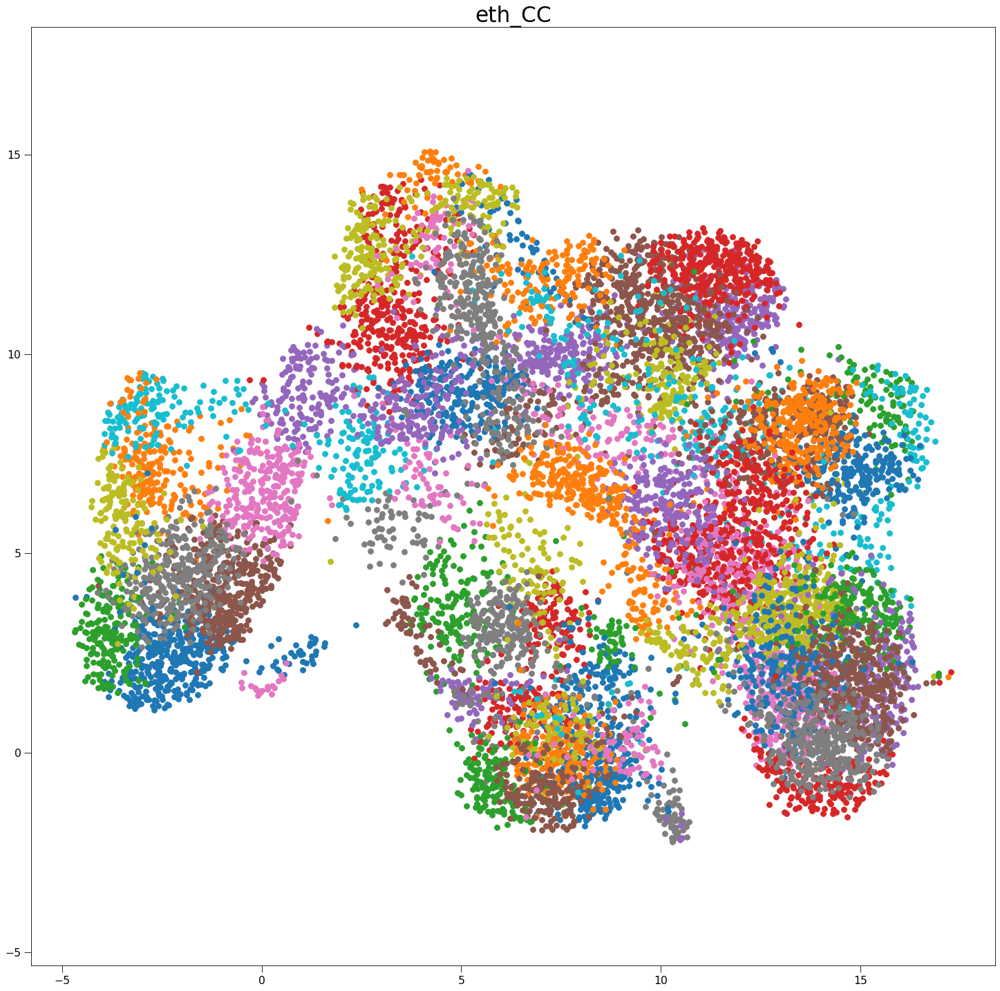

In [7]:
fig, ax = plt.subplots(1, figsize=(24,24))
plot_points(embedding, dataset, ax, labels)
ax.get_legend().remove()
plt.show()

In [8]:
components = []
node_labels = [None for _ in range(number_of_nodes)]
for label in np.sort(unique_labels):
    component = np.argwhere(label == labels).T
    assert len(component) == 1
    
    for node in component[0]:
        node_labels[node] = label
        
    components.append(component[0].tolist())

sub_ICTs = []

# Put the clusters with #nodes < threshold to the cluster of the nearest node
# PCA since clusters are computed in pca space!
distances = pairwise_distances(pca, pca)

cleaned_components = [False for _ in range(len(unique_labels))]

while True:
    
    for idx, component in enumerate(components):
        
        if cleaned_components[idx] == True:
            continue
        
        if len(component) <= threshold:
            
            for node in component:
                nearests = np.argsort(distances[node])
                for elem in nearests:
                    if elem not in component:
                        nearest = elem
                node_labels[node] = node_labels[nearest]
                components[node_labels[nearest]].append(node)
                cleaned_components[idx] = True
                continue
    
    break

new_components = []
new_node_labels = [None for _ in range(number_of_nodes)]
    
for idx, component in enumerate(components):
    if cleaned_components[idx] == False:
        new_components.append(component)
        for node in component:
            new_node_labels[node] = idx
            
unique_labels = np.unique(new_node_labels)
components = new_components
node_labels = new_node_labels



for component in tqdm(components):
    
    sub_number_of_nodes = len(component)
    
    sub_G, _ = create_graph(sub_number_of_nodes, mode, position=pca[component], k=4,
                            beta=2, delta=0.5, bridges=4)
    sub_G.indexEdges()

    sub_ICT = calculate_ICT(sub_G, algorithm_type="exact_own",
                                   zeros_stay_zeros=True, update_G=1.1)
    sub_ICT.indexEdges()
    sub_ICTs.append(sub_ICT)

  0%|          | 0/79 [00:00<?, ?it/s]

calculating the densities for the density criterion:   0%|          | 0/124 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/425 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/425 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/425 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/123 [00:00<?, ?it/s]

update Arr 425 -> 385
added 2 edges early
update Arr 385 -> 348
update Arr 348 -> 316
update Arr 316 -> 287
update Arr 287 -> 259
update Arr 259 -> 234
update Arr 234 -> 211
update Arr 211 -> 190
update Arr 190 -> 171
update Arr 171 -> 154
update Arr 154 -> 139
update Arr 139 -> 133
update Arr 133 -> 130
update Arr 130 -> 129
update Arr 129 -> 126
update Arr 126 -> 125
update Arr 125 -> 124


calculating the densities for the density criterion:   0%|          | 0/13 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/42 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/42 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/42 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 42 -> 36
added 2 edges early
update Arr 36 -> 30
update Arr 30 -> 24
update Arr 24 -> 21
update Arr 21 -> 19
update Arr 19 -> 15
update Arr 15 -> 14
update Arr 14 -> 13
update Arr 13 -> 12


calculating the densities for the density criterion:   0%|          | 0/76 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/262 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/262 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/262 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/75 [00:00<?, ?it/s]

update Arr 262 -> 232
added 2 edges early
update Arr 232 -> 200
added 2 edges early
update Arr 200 -> 181
update Arr 181 -> 164
update Arr 164 -> 149
update Arr 149 -> 134
update Arr 134 -> 120
update Arr 120 -> 108
update Arr 108 -> 98
update Arr 98 -> 89
update Arr 89 -> 85
update Arr 85 -> 80
update Arr 80 -> 79
update Arr 79 -> 79
update Arr 79 -> 78
update Arr 78 -> 77
update Arr 77 -> 76


calculating the densities for the density criterion:   0%|          | 0/355 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1315 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1315 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1315 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/354 [00:00<?, ?it/s]

update Arr 1315 -> 1186
added 8 edges early
update Arr 1186 -> 1067
update Arr 1067 -> 962
added 4 edges early
update Arr 962 -> 874
added 4 edges early
update Arr 874 -> 794
update Arr 794 -> 721
update Arr 721 -> 655
update Arr 655 -> 595
update Arr 595 -> 540
update Arr 540 -> 488
update Arr 488 -> 442
update Arr 442 -> 401
update Arr 401 -> 356
added 6 edges early
update Arr 356 -> 356
update Arr 356 -> 355
update Arr 355 -> 354


calculating the densities for the density criterion:   0%|          | 0/69 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/240 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/240 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/240 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/68 [00:00<?, ?it/s]

update Arr 240 -> 209
update Arr 209 -> 186
update Arr 186 -> 169
update Arr 169 -> 153
update Arr 153 -> 138
update Arr 138 -> 124
update Arr 124 -> 111
update Arr 111 -> 99
update Arr 99 -> 89
update Arr 89 -> 79
update Arr 79 -> 76
update Arr 76 -> 76
update Arr 76 -> 75
update Arr 75 -> 73
update Arr 73 -> 72
update Arr 72 -> 71
update Arr 71 -> 69


calculating the densities for the density criterion:   0%|          | 0/61 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/218 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/218 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/218 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/60 [00:00<?, ?it/s]

update Arr 218 -> 196
update Arr 196 -> 175
update Arr 175 -> 155
update Arr 155 -> 140
update Arr 140 -> 127
update Arr 127 -> 115
update Arr 115 -> 102
update Arr 102 -> 92
update Arr 92 -> 81
update Arr 81 -> 73
update Arr 73 -> 67
update Arr 67 -> 67
update Arr 67 -> 66
update Arr 66 -> 65
update Arr 65 -> 64
update Arr 64 -> 64
update Arr 64 -> 63
update Arr 63 -> 62
update Arr 62 -> 61


calculating the densities for the density criterion:   0%|          | 0/67 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/217 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/217 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/217 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/66 [00:00<?, ?it/s]

update Arr 217 -> 196
added 3 edges early
update Arr 196 -> 176
update Arr 176 -> 158
added 2 edges early
update Arr 158 -> 143
update Arr 143 -> 129
update Arr 129 -> 117
update Arr 117 -> 105
update Arr 105 -> 93
update Arr 93 -> 84
update Arr 84 -> 76
update Arr 76 -> 75
update Arr 75 -> 72
update Arr 72 -> 72
update Arr 72 -> 69
update Arr 69 -> 67


calculating the densities for the density criterion:   0%|          | 0/278 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/997 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/997 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/997 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/277 [00:00<?, ?it/s]

update Arr 997 -> 898
added 4 edges early
update Arr 898 -> 811
update Arr 811 -> 735
added 2 edges early
update Arr 735 -> 668
update Arr 668 -> 606
update Arr 606 -> 548
update Arr 548 -> 498
update Arr 498 -> 449
update Arr 449 -> 408
update Arr 408 -> 369
update Arr 369 -> 335
update Arr 335 -> 304
update Arr 304 -> 282
added 3 edges early
update Arr 282 -> 282
update Arr 282 -> 281
update Arr 281 -> 280
update Arr 280 -> 279
update Arr 279 -> 278


calculating the densities for the density criterion:   0%|          | 0/276 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/996 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/996 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/996 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/275 [00:00<?, ?it/s]

update Arr 996 -> 905
added 3 edges early
update Arr 905 -> 819
update Arr 819 -> 742
added 3 edges early
update Arr 742 -> 665
added 2 edges early
update Arr 665 -> 603
update Arr 603 -> 547
update Arr 547 -> 496
update Arr 496 -> 447
update Arr 447 -> 406
update Arr 406 -> 368
update Arr 368 -> 333
update Arr 333 -> 301
update Arr 301 -> 285
update Arr 285 -> 279
added 2 edges early
update Arr 279 -> 279
update Arr 279 -> 278
update Arr 278 -> 277
update Arr 277 -> 277
update Arr 277 -> 276


calculating the densities for the density criterion:   0%|          | 0/160 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/594 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/594 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/594 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/159 [00:00<?, ?it/s]

update Arr 594 -> 535
added 6 edges early
update Arr 535 -> 482
update Arr 482 -> 438
update Arr 438 -> 396
update Arr 396 -> 339
added 6 edges early
update Arr 339 -> 308
update Arr 308 -> 279
update Arr 279 -> 253
update Arr 253 -> 227
update Arr 227 -> 206
update Arr 206 -> 186
update Arr 186 -> 167
update Arr 167 -> 161
added 3 edges early
update Arr 161 -> 161
update Arr 161 -> 160
update Arr 160 -> 160


calculating the densities for the density criterion:   0%|          | 0/156 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/554 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/554 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/554 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/155 [00:00<?, ?it/s]

update Arr 554 -> 501
update Arr 501 -> 437
update Arr 437 -> 392
update Arr 392 -> 356
update Arr 356 -> 323
update Arr 323 -> 293
update Arr 293 -> 265
update Arr 265 -> 240
update Arr 240 -> 218
update Arr 218 -> 197
update Arr 197 -> 177
update Arr 177 -> 161
update Arr 161 -> 161
update Arr 161 -> 160
update Arr 160 -> 159
update Arr 159 -> 158
update Arr 158 -> 158
update Arr 158 -> 156
update Arr 156 -> 156


calculating the densities for the density criterion:   0%|          | 0/175 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/627 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/627 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/627 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/174 [00:00<?, ?it/s]

update Arr 627 -> 569
added 5 edges early
update Arr 569 -> 516
update Arr 516 -> 467
update Arr 467 -> 424
update Arr 424 -> 385
update Arr 385 -> 347
update Arr 347 -> 314
update Arr 314 -> 283
update Arr 283 -> 256
update Arr 256 -> 231
update Arr 231 -> 207
update Arr 207 -> 188
update Arr 188 -> 182
update Arr 182 -> 179
update Arr 179 -> 179
update Arr 179 -> 178
update Arr 178 -> 177
update Arr 177 -> 175


calculating the densities for the density criterion:   0%|          | 0/143 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/507 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/507 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/507 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/142 [00:00<?, ?it/s]

update Arr 507 -> 457
update Arr 457 -> 413
update Arr 413 -> 374
update Arr 374 -> 338
update Arr 338 -> 306
update Arr 306 -> 278
update Arr 278 -> 252
update Arr 252 -> 229
update Arr 229 -> 208
update Arr 208 -> 189
update Arr 189 -> 171
update Arr 171 -> 153
update Arr 153 -> 152
update Arr 152 -> 151
update Arr 151 -> 149
update Arr 149 -> 144
added 2 edges early
update Arr 144 -> 144
update Arr 144 -> 143
update Arr 143 -> 143


calculating the densities for the density criterion:   0%|          | 0/118 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/407 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/407 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/407 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/117 [00:00<?, ?it/s]

update Arr 407 -> 362
update Arr 362 -> 316
update Arr 316 -> 287
update Arr 287 -> 259
update Arr 259 -> 235
update Arr 235 -> 211
update Arr 211 -> 191
update Arr 191 -> 171
update Arr 171 -> 155
update Arr 155 -> 140
update Arr 140 -> 126
update Arr 126 -> 126
update Arr 126 -> 125
update Arr 125 -> 125
update Arr 125 -> 124
update Arr 124 -> 123
update Arr 123 -> 122
update Arr 122 -> 121
update Arr 121 -> 120
update Arr 120 -> 119
update Arr 119 -> 118


calculating the densities for the density criterion:   0%|          | 0/164 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/579 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/579 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/579 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/163 [00:00<?, ?it/s]

update Arr 579 -> 522
added 4 edges early
update Arr 522 -> 474
update Arr 474 -> 422
added 2 edges early
update Arr 422 -> 383
update Arr 383 -> 346
update Arr 346 -> 314
update Arr 314 -> 283
update Arr 283 -> 255
update Arr 255 -> 230
update Arr 230 -> 209
update Arr 209 -> 188
update Arr 188 -> 171
update Arr 171 -> 171
update Arr 171 -> 170
update Arr 170 -> 170
update Arr 170 -> 168
update Arr 168 -> 166
update Arr 166 -> 165
update Arr 165 -> 164


calculating the densities for the density criterion:   0%|          | 0/289 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1023 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1023 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1023 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/288 [00:00<?, ?it/s]

update Arr 1023 -> 919
added 4 edges early
update Arr 919 -> 830
update Arr 830 -> 753
added 4 edges early
update Arr 753 -> 684
update Arr 684 -> 620
update Arr 620 -> 563
update Arr 563 -> 510
update Arr 510 -> 461
update Arr 461 -> 419
update Arr 419 -> 379
update Arr 379 -> 343
update Arr 343 -> 311
update Arr 311 -> 298
update Arr 298 -> 293
added 2 edges early
update Arr 293 -> 293
update Arr 293 -> 292
update Arr 292 -> 292
update Arr 292 -> 291
update Arr 291 -> 290
update Arr 290 -> 289


calculating the densities for the density criterion:   0%|          | 0/194 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/725 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/725 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/725 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/193 [00:00<?, ?it/s]

update Arr 725 -> 640
added 4 edges early
update Arr 640 -> 576
update Arr 576 -> 523
added 2 edges early
update Arr 523 -> 467
added 3 edges early
update Arr 467 -> 423
update Arr 423 -> 384
update Arr 384 -> 349
update Arr 349 -> 316
update Arr 316 -> 287
update Arr 287 -> 259
update Arr 259 -> 233
update Arr 233 -> 211
update Arr 211 -> 202
update Arr 202 -> 202
update Arr 202 -> 200
update Arr 200 -> 198
update Arr 198 -> 195
update Arr 195 -> 195
update Arr 195 -> 194


calculating the densities for the density criterion:   0%|          | 0/19 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/62 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/62 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/62 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 62 -> 50
update Arr 50 -> 45
update Arr 45 -> 39
update Arr 39 -> 33
update Arr 33 -> 29
update Arr 29 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
update Arr 25 -> 24
update Arr 24 -> 22
update Arr 22 -> 21


calculating the densities for the density criterion:   0%|          | 0/360 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1345 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1345 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1345 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/359 [00:00<?, ?it/s]

update Arr 1345 -> 1217
added 8 edges early
update Arr 1217 -> 1106
added 2 edges early
update Arr 1106 -> 997
added 2 edges early
update Arr 997 -> 902
added 5 edges early
update Arr 902 -> 819
update Arr 819 -> 742
update Arr 742 -> 673
update Arr 673 -> 608
update Arr 608 -> 552
update Arr 552 -> 501
update Arr 501 -> 454
update Arr 454 -> 411
update Arr 411 -> 370
added 2 edges early
update Arr 370 -> 369
update Arr 369 -> 368
update Arr 368 -> 367
update Arr 367 -> 361
added 5 edges early
update Arr 361 -> 361
update Arr 361 -> 360


calculating the densities for the density criterion:   0%|          | 0/68 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/239 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/239 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/239 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/67 [00:00<?, ?it/s]

update Arr 239 -> 211
added 2 edges early
update Arr 211 -> 183
update Arr 183 -> 166
update Arr 166 -> 150
update Arr 150 -> 135
update Arr 135 -> 121
update Arr 121 -> 106
update Arr 106 -> 96
update Arr 96 -> 87
update Arr 87 -> 78
update Arr 78 -> 77
update Arr 77 -> 76
update Arr 76 -> 75
update Arr 75 -> 74
update Arr 74 -> 69
update Arr 69 -> 69
update Arr 69 -> 68
update Arr 68 -> 67


calculating the densities for the density criterion:   0%|          | 0/305 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1133 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1133 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1133 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/304 [00:00<?, ?it/s]

update Arr 1133 -> 1006
added 4 edges early
update Arr 1006 -> 887
added 5 edges early
update Arr 887 -> 803
added 4 edges early
update Arr 803 -> 725
added 2 edges early
update Arr 725 -> 659
update Arr 659 -> 599
update Arr 599 -> 544
update Arr 544 -> 494
update Arr 494 -> 448
update Arr 448 -> 404
update Arr 404 -> 367
update Arr 367 -> 333
update Arr 333 -> 314
update Arr 314 -> 308
added 5 edges early
update Arr 308 -> 308
update Arr 308 -> 307
update Arr 307 -> 306
update Arr 306 -> 305


calculating the densities for the density criterion:   0%|          | 0/166 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/604 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/604 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/604 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/165 [00:00<?, ?it/s]

update Arr 604 -> 532
added 3 edges early
update Arr 532 -> 483
update Arr 483 -> 439
added 2 edges early
update Arr 439 -> 393
added 2 edges early
update Arr 393 -> 356
update Arr 356 -> 323
update Arr 323 -> 293
update Arr 293 -> 266
update Arr 266 -> 240
update Arr 240 -> 217
update Arr 217 -> 195
update Arr 195 -> 177
update Arr 177 -> 174
update Arr 174 -> 172
update Arr 172 -> 171
update Arr 171 -> 167
update Arr 167 -> 167
update Arr 167 -> 166


calculating the densities for the density criterion:   0%|          | 0/170 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/589 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/589 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/589 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/169 [00:00<?, ?it/s]

update Arr 589 -> 531
added 3 edges early
update Arr 531 -> 482
update Arr 482 -> 438
update Arr 438 -> 396
update Arr 396 -> 359
update Arr 359 -> 326
update Arr 326 -> 296
update Arr 296 -> 268
update Arr 268 -> 242
update Arr 242 -> 217
update Arr 217 -> 196
update Arr 196 -> 177
added 2 edges early
update Arr 177 -> 177
update Arr 177 -> 176
update Arr 176 -> 176
update Arr 176 -> 175
update Arr 175 -> 174
update Arr 174 -> 171
update Arr 171 -> 171
update Arr 171 -> 170


calculating the densities for the density criterion:   0%|          | 0/236 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/850 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/850 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/850 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/235 [00:00<?, ?it/s]

update Arr 850 -> 759
added 3 edges early
update Arr 759 -> 677
update Arr 677 -> 613
update Arr 613 -> 557
update Arr 557 -> 505
update Arr 505 -> 458
update Arr 458 -> 416
update Arr 416 -> 377
update Arr 377 -> 340
update Arr 340 -> 309
update Arr 309 -> 277
update Arr 277 -> 251
update Arr 251 -> 245
update Arr 245 -> 244
update Arr 244 -> 243
update Arr 243 -> 241
update Arr 241 -> 240
update Arr 240 -> 238
update Arr 238 -> 236


calculating the densities for the density criterion:   0%|          | 0/105 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/364 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/364 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/364 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/104 [00:00<?, ?it/s]

update Arr 364 -> 325
update Arr 325 -> 294
update Arr 294 -> 261
update Arr 261 -> 230
added 2 edges early
update Arr 230 -> 209
update Arr 209 -> 189
update Arr 189 -> 170
update Arr 170 -> 154
update Arr 154 -> 138
update Arr 138 -> 124
update Arr 124 -> 112
update Arr 112 -> 111
update Arr 111 -> 109
update Arr 109 -> 108
update Arr 108 -> 105
added 2 edges early
update Arr 105 -> 105


calculating the densities for the density criterion:   0%|          | 0/128 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/476 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/476 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/476 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/127 [00:00<?, ?it/s]

update Arr 476 -> 431
update Arr 431 -> 388
update Arr 388 -> 347
added 2 edges early
update Arr 347 -> 315
update Arr 315 -> 285
update Arr 285 -> 258
update Arr 258 -> 234
update Arr 234 -> 210
update Arr 210 -> 188
update Arr 188 -> 168
update Arr 168 -> 147
update Arr 147 -> 137
update Arr 137 -> 135
update Arr 135 -> 134
update Arr 134 -> 133
update Arr 133 -> 132
update Arr 132 -> 131
update Arr 131 -> 130
update Arr 130 -> 128


calculating the densities for the density criterion:   0%|          | 0/228 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/837 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/837 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/837 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/227 [00:00<?, ?it/s]

update Arr 837 -> 749
added 8 edges early
update Arr 749 -> 676
update Arr 676 -> 612
update Arr 612 -> 537
added 4 edges early
update Arr 537 -> 487
update Arr 487 -> 441
update Arr 441 -> 399
update Arr 399 -> 362
update Arr 362 -> 329
update Arr 329 -> 297
update Arr 297 -> 268
update Arr 268 -> 243
update Arr 243 -> 236
update Arr 236 -> 232
added 3 edges early
update Arr 232 -> 232
update Arr 232 -> 231
update Arr 231 -> 230
update Arr 230 -> 229
update Arr 229 -> 228


calculating the densities for the density criterion:   0%|          | 0/10 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/30 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/30 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/30 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/9 [00:00<?, ?it/s]

update Arr 30 -> 27
update Arr 27 -> 21
update Arr 21 -> 18
update Arr 18 -> 14
update Arr 14 -> 12
update Arr 12 -> 12
update Arr 12 -> 9


calculating the densities for the density criterion:   0%|          | 0/243 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/916 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/916 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/916 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/242 [00:00<?, ?it/s]

update Arr 916 -> 829
added 4 edges early
update Arr 829 -> 745
update Arr 745 -> 662
added 6 edges early
update Arr 662 -> 598
added 6 edges early
update Arr 598 -> 543
update Arr 543 -> 493
update Arr 493 -> 448
update Arr 448 -> 403
update Arr 403 -> 366
update Arr 366 -> 330
update Arr 330 -> 297
update Arr 297 -> 268
update Arr 268 -> 252
update Arr 252 -> 251
update Arr 251 -> 250
update Arr 250 -> 249
update Arr 249 -> 248
update Arr 248 -> 244
added 3 edges early
update Arr 244 -> 244
update Arr 244 -> 243


calculating the densities for the density criterion:   0%|          | 0/13 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/41 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/41 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/41 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 41 -> 36
update Arr 36 -> 28
update Arr 28 -> 24
update Arr 24 -> 22
update Arr 22 -> 21
update Arr 21 -> 19
update Arr 19 -> 14
update Arr 14 -> 14


calculating the densities for the density criterion:   0%|          | 0/32 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/95 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/95 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/95 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 95 -> 86
added 3 edges early
update Arr 86 -> 76
update Arr 76 -> 69
update Arr 69 -> 57
update Arr 57 -> 51
update Arr 51 -> 46
update Arr 46 -> 41
update Arr 41 -> 38
update Arr 38 -> 36
update Arr 36 -> 33
update Arr 33 -> 33
update Arr 33 -> 32


calculating the densities for the density criterion:   0%|          | 0/76 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/270 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/270 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/270 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/75 [00:00<?, ?it/s]

update Arr 270 -> 237
added 2 edges early
update Arr 237 -> 211
update Arr 211 -> 183
added 2 edges early
update Arr 183 -> 165
update Arr 165 -> 148
update Arr 148 -> 133
update Arr 133 -> 118
update Arr 118 -> 106
update Arr 106 -> 96
update Arr 96 -> 87
update Arr 87 -> 85
update Arr 85 -> 81
update Arr 81 -> 76
added 4 edges early
update Arr 76 -> 76


calculating the densities for the density criterion:   0%|          | 0/142 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/519 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/519 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/519 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/141 [00:00<?, ?it/s]

update Arr 519 -> 459
added 2 edges early
update Arr 459 -> 411
update Arr 411 -> 372
update Arr 372 -> 336
update Arr 336 -> 304
update Arr 304 -> 275
update Arr 275 -> 248
update Arr 248 -> 222
update Arr 222 -> 200
update Arr 200 -> 180
update Arr 180 -> 163
update Arr 163 -> 151
update Arr 151 -> 149
update Arr 149 -> 142
added 4 edges early
update Arr 142 -> 142
update Arr 142 -> 141


calculating the densities for the density criterion:   0%|          | 0/133 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/500 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/500 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/500 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/132 [00:00<?, ?it/s]

update Arr 500 -> 450
update Arr 450 -> 409
update Arr 409 -> 370
update Arr 370 -> 335
update Arr 335 -> 304
update Arr 304 -> 276
update Arr 276 -> 250
update Arr 250 -> 227
update Arr 227 -> 206
update Arr 206 -> 186
update Arr 186 -> 169
update Arr 169 -> 151
update Arr 151 -> 142
update Arr 142 -> 142
update Arr 142 -> 141
update Arr 141 -> 140
update Arr 140 -> 138
update Arr 138 -> 136
update Arr 136 -> 135
update Arr 135 -> 134
update Arr 134 -> 133


calculating the densities for the density criterion:   0%|          | 0/136 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/476 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/476 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/476 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/135 [00:00<?, ?it/s]

update Arr 476 -> 426
added 2 edges early
update Arr 426 -> 387
update Arr 387 -> 349
update Arr 349 -> 316
update Arr 316 -> 285
update Arr 285 -> 259
update Arr 259 -> 235
update Arr 235 -> 212
update Arr 212 -> 191
update Arr 191 -> 168
update Arr 168 -> 152
update Arr 152 -> 144
update Arr 144 -> 142
update Arr 142 -> 141
update Arr 141 -> 137
added 2 edges early
update Arr 137 -> 137
update Arr 137 -> 136


calculating the densities for the density criterion:   0%|          | 0/136 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/490 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/490 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/490 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/135 [00:00<?, ?it/s]

update Arr 490 -> 437
added 3 edges early
update Arr 437 -> 396
update Arr 396 -> 357
added 2 edges early
update Arr 357 -> 309
update Arr 309 -> 280
update Arr 280 -> 254
update Arr 254 -> 229
update Arr 229 -> 208
update Arr 208 -> 188
update Arr 188 -> 170
update Arr 170 -> 154
update Arr 154 -> 145
update Arr 145 -> 144
update Arr 144 -> 143
update Arr 143 -> 142
update Arr 142 -> 141
update Arr 141 -> 139
update Arr 139 -> 139
update Arr 139 -> 136
added 2 edges early
update Arr 136 -> 136


calculating the densities for the density criterion:   0%|          | 0/108 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/365 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/365 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/365 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/107 [00:00<?, ?it/s]

update Arr 365 -> 327
update Arr 327 -> 297
update Arr 297 -> 262
update Arr 262 -> 237
update Arr 237 -> 214
update Arr 214 -> 194
update Arr 194 -> 175
update Arr 175 -> 159
update Arr 159 -> 143
update Arr 143 -> 129
update Arr 129 -> 117
update Arr 117 -> 116
update Arr 116 -> 113
update Arr 113 -> 113
update Arr 113 -> 112
update Arr 112 -> 111
update Arr 111 -> 110
update Arr 110 -> 109
update Arr 109 -> 108


calculating the densities for the density criterion:   0%|          | 0/241 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/898 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/898 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/898 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/240 [00:00<?, ?it/s]

update Arr 898 -> 803
added 3 edges early
update Arr 803 -> 729
update Arr 729 -> 658
added 2 edges early
update Arr 658 -> 591
added 5 edges early
update Arr 591 -> 536
update Arr 536 -> 487
update Arr 487 -> 442
update Arr 442 -> 400
update Arr 400 -> 359
update Arr 359 -> 323
update Arr 323 -> 292
update Arr 292 -> 265
added 2 edges early
update Arr 265 -> 246
added 3 edges early
update Arr 246 -> 246
update Arr 246 -> 245
update Arr 245 -> 244
update Arr 244 -> 244
update Arr 244 -> 243
update Arr 243 -> 241


calculating the densities for the density criterion:   0%|          | 0/86 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/314 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/314 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/314 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/85 [00:00<?, ?it/s]

update Arr 314 -> 276
added 4 edges early
update Arr 276 -> 250
update Arr 250 -> 223
update Arr 223 -> 193
update Arr 193 -> 175
update Arr 175 -> 158
update Arr 158 -> 142
update Arr 142 -> 129
update Arr 129 -> 117
update Arr 117 -> 106
update Arr 106 -> 96
update Arr 96 -> 92
update Arr 92 -> 91
update Arr 91 -> 90
update Arr 90 -> 85
added 3 edges early


calculating the densities for the density criterion:   0%|          | 0/63 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/212 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/212 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/212 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/62 [00:00<?, ?it/s]

update Arr 212 -> 192
added 2 edges early
update Arr 192 -> 162
update Arr 162 -> 146
update Arr 146 -> 131
update Arr 131 -> 118
update Arr 118 -> 105
update Arr 105 -> 94
update Arr 94 -> 85
update Arr 85 -> 75
update Arr 75 -> 72
update Arr 72 -> 67
update Arr 67 -> 67
update Arr 67 -> 66
update Arr 66 -> 65
update Arr 65 -> 64


calculating the densities for the density criterion:   0%|          | 0/342 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1264 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1264 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1264 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/341 [00:00<?, ?it/s]

update Arr 1264 -> 1145
added 2 edges early
update Arr 1145 -> 1034
update Arr 1034 -> 938
update Arr 938 -> 850
added 2 edges early
update Arr 850 -> 772
update Arr 772 -> 700
update Arr 700 -> 636
update Arr 636 -> 578
update Arr 578 -> 524
update Arr 524 -> 476
update Arr 476 -> 432
update Arr 432 -> 392
update Arr 392 -> 353
added 3 edges early
update Arr 353 -> 351
update Arr 351 -> 350
update Arr 350 -> 345
added 3 edges early
update Arr 345 -> 345
update Arr 345 -> 344
update Arr 344 -> 343
update Arr 343 -> 342


calculating the densities for the density criterion:   0%|          | 0/212 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/787 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/787 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/787 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/211 [00:00<?, ?it/s]

update Arr 787 -> 711
added 5 edges early
update Arr 711 -> 646
update Arr 646 -> 586
update Arr 586 -> 531
update Arr 531 -> 482
update Arr 482 -> 437
update Arr 437 -> 397
update Arr 397 -> 360
update Arr 360 -> 327
update Arr 327 -> 296
update Arr 296 -> 265
update Arr 265 -> 240
update Arr 240 -> 215
added 5 edges early
update Arr 215 -> 215
update Arr 215 -> 214
update Arr 214 -> 213
update Arr 213 -> 212


calculating the densities for the density criterion:   0%|          | 0/115 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/406 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/406 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/406 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/114 [00:00<?, ?it/s]

update Arr 406 -> 365
update Arr 365 -> 328
update Arr 328 -> 291
update Arr 291 -> 264
update Arr 264 -> 238
update Arr 238 -> 215
update Arr 215 -> 194
update Arr 194 -> 174
update Arr 174 -> 158
update Arr 158 -> 142
update Arr 142 -> 129
update Arr 129 -> 124
update Arr 124 -> 123
update Arr 123 -> 120
update Arr 120 -> 118
update Arr 118 -> 116
update Arr 116 -> 115


calculating the densities for the density criterion:   0%|          | 0/244 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/876 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/876 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/876 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/243 [00:00<?, ?it/s]

update Arr 876 -> 792
added 9 edges early
update Arr 792 -> 701
update Arr 701 -> 635
update Arr 635 -> 571
added 2 edges early
update Arr 571 -> 518
update Arr 518 -> 470
update Arr 470 -> 427
update Arr 427 -> 388
update Arr 388 -> 351
update Arr 351 -> 317
update Arr 317 -> 284
update Arr 284 -> 255
added 3 edges early
update Arr 255 -> 248
added 3 edges early
update Arr 248 -> 248
update Arr 248 -> 247
update Arr 247 -> 247
update Arr 247 -> 246
update Arr 246 -> 245
update Arr 245 -> 244


calculating the densities for the density criterion:   0%|          | 0/84 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/297 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/297 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/297 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/83 [00:00<?, ?it/s]

update Arr 297 -> 268
update Arr 268 -> 241
update Arr 241 -> 219
update Arr 219 -> 198
update Arr 198 -> 179
update Arr 179 -> 162
update Arr 162 -> 143
update Arr 143 -> 128
update Arr 128 -> 114
update Arr 114 -> 101
update Arr 101 -> 92
update Arr 92 -> 90
update Arr 90 -> 89
update Arr 89 -> 85
update Arr 85 -> 85
update Arr 85 -> 84
update Arr 84 -> 84


calculating the densities for the density criterion:   0%|          | 0/191 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/716 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/716 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/716 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/190 [00:00<?, ?it/s]

update Arr 716 -> 635
added 7 edges early
update Arr 635 -> 577
update Arr 577 -> 524
added 3 edges early
update Arr 524 -> 474
added 3 edges early
update Arr 474 -> 430
update Arr 430 -> 388
update Arr 388 -> 352
update Arr 352 -> 319
update Arr 319 -> 287
update Arr 287 -> 258
update Arr 258 -> 233
update Arr 233 -> 203
added 6 edges early
update Arr 203 -> 199
update Arr 199 -> 199
update Arr 199 -> 198
update Arr 198 -> 196
update Arr 196 -> 195
update Arr 195 -> 193
update Arr 193 -> 191


calculating the densities for the density criterion:   0%|          | 0/357 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1360 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1360 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1360 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/356 [00:00<?, ?it/s]

update Arr 1360 -> 1224
added 7 edges early
update Arr 1224 -> 1094
added 3 edges early
update Arr 1094 -> 977
added 3 edges early
update Arr 977 -> 884
added 5 edges early
update Arr 884 -> 803
update Arr 803 -> 728
update Arr 728 -> 661
update Arr 661 -> 599
update Arr 599 -> 543
update Arr 543 -> 490
update Arr 490 -> 444
update Arr 444 -> 401
update Arr 401 -> 366
update Arr 366 -> 365
update Arr 365 -> 363
update Arr 363 -> 358
added 4 edges early
update Arr 358 -> 358
update Arr 358 -> 357


calculating the densities for the density criterion:   0%|          | 0/76 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/255 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/255 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/255 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/75 [00:00<?, ?it/s]

update Arr 255 -> 230
update Arr 230 -> 206
update Arr 206 -> 182
update Arr 182 -> 164
update Arr 164 -> 148
update Arr 148 -> 132
update Arr 132 -> 119
update Arr 119 -> 108
update Arr 108 -> 98
update Arr 98 -> 89
update Arr 89 -> 85
update Arr 85 -> 83
update Arr 83 -> 78
update Arr 78 -> 78
update Arr 78 -> 77
update Arr 77 -> 76
update Arr 76 -> 76


calculating the densities for the density criterion:   0%|          | 0/263 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/975 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/975 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/975 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/262 [00:00<?, ?it/s]

update Arr 975 -> 877
added 4 edges early
update Arr 877 -> 788
update Arr 788 -> 716
update Arr 716 -> 647
added 3 edges early
update Arr 647 -> 588
update Arr 588 -> 534
update Arr 534 -> 483
update Arr 483 -> 438
update Arr 438 -> 397
update Arr 397 -> 358
update Arr 358 -> 324
update Arr 324 -> 294
update Arr 294 -> 269
added 2 edges early
update Arr 269 -> 269
update Arr 269 -> 268
update Arr 268 -> 267
update Arr 267 -> 267
update Arr 267 -> 266
update Arr 266 -> 264
update Arr 264 -> 263
update Arr 263 -> 263


calculating the densities for the density criterion:   0%|          | 0/190 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/677 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/677 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/677 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/189 [00:00<?, ?it/s]

update Arr 677 -> 606
update Arr 606 -> 545
update Arr 545 -> 495
added 3 edges early
update Arr 495 -> 449
update Arr 449 -> 407
update Arr 407 -> 367
update Arr 367 -> 331
update Arr 331 -> 300
update Arr 300 -> 272
update Arr 272 -> 246
update Arr 246 -> 223
update Arr 223 -> 202
update Arr 202 -> 196
update Arr 196 -> 196
update Arr 196 -> 195
update Arr 195 -> 194
update Arr 194 -> 193
update Arr 193 -> 193
update Arr 193 -> 192
update Arr 192 -> 191
update Arr 191 -> 190


calculating the densities for the density criterion:   0%|          | 0/101 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/355 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/355 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/355 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/100 [00:00<?, ?it/s]

update Arr 355 -> 319
update Arr 319 -> 287
update Arr 287 -> 259
update Arr 259 -> 235
update Arr 235 -> 212
update Arr 212 -> 192
update Arr 192 -> 174
update Arr 174 -> 158
update Arr 158 -> 140
update Arr 140 -> 127
update Arr 127 -> 115
update Arr 115 -> 110
update Arr 110 -> 110
update Arr 110 -> 109
update Arr 109 -> 107
update Arr 107 -> 105
update Arr 105 -> 103
update Arr 103 -> 103
update Arr 103 -> 102


calculating the densities for the density criterion:   0%|          | 0/306 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1149 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1149 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1149 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/305 [00:00<?, ?it/s]

update Arr 1149 -> 1037
added 5 edges early
update Arr 1037 -> 936
update Arr 936 -> 846
added 2 edges early
update Arr 846 -> 769
update Arr 769 -> 698
update Arr 698 -> 633
update Arr 633 -> 575
update Arr 575 -> 522
update Arr 522 -> 474
update Arr 474 -> 430
update Arr 430 -> 390
update Arr 390 -> 353
update Arr 353 -> 313
added 5 edges early
update Arr 313 -> 313
update Arr 313 -> 312
update Arr 312 -> 311
update Arr 311 -> 310
update Arr 310 -> 307
update Arr 307 -> 307


calculating the densities for the density criterion:   0%|          | 0/135 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/472 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/472 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/472 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/134 [00:00<?, ?it/s]

update Arr 472 -> 425
added 2 edges early
update Arr 425 -> 386
update Arr 386 -> 345
update Arr 345 -> 313
update Arr 313 -> 283
update Arr 283 -> 256
update Arr 256 -> 231
update Arr 231 -> 209
update Arr 209 -> 186
update Arr 186 -> 169
update Arr 169 -> 153
update Arr 153 -> 144
update Arr 144 -> 143
update Arr 143 -> 139
update Arr 139 -> 138
update Arr 138 -> 137
update Arr 137 -> 137
update Arr 137 -> 136


calculating the densities for the density criterion:   0%|          | 0/59 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/210 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/210 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/210 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/58 [00:00<?, ?it/s]

update Arr 210 -> 181
update Arr 181 -> 162
update Arr 162 -> 147
update Arr 147 -> 131
update Arr 131 -> 119
update Arr 119 -> 106
update Arr 106 -> 94
update Arr 94 -> 85
update Arr 85 -> 77
update Arr 77 -> 68
update Arr 68 -> 66
update Arr 66 -> 64
update Arr 64 -> 63
update Arr 63 -> 62
update Arr 62 -> 60
update Arr 60 -> 59


calculating the densities for the density criterion:   0%|          | 0/281 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1050 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1050 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1050 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/280 [00:00<?, ?it/s]

update Arr 1050 -> 951
added 8 edges early
update Arr 951 -> 863
update Arr 863 -> 782
added 2 edges early
update Arr 782 -> 710
added 6 edges early
update Arr 710 -> 645
update Arr 645 -> 586
update Arr 586 -> 532
update Arr 532 -> 482
update Arr 482 -> 438
update Arr 438 -> 398
update Arr 398 -> 361
update Arr 361 -> 328
update Arr 328 -> 294
update Arr 294 -> 288
update Arr 288 -> 287
update Arr 287 -> 286
update Arr 286 -> 280
added 5 edges early


calculating the densities for the density criterion:   0%|          | 0/321 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1174 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/320 [00:00<?, ?it/s]

update Arr 1174 -> 1066
added 4 edges early
update Arr 1066 -> 962
update Arr 962 -> 874
added 2 edges early
update Arr 874 -> 790
added 3 edges early
update Arr 790 -> 714
added 6 edges early
update Arr 714 -> 648
update Arr 648 -> 589
update Arr 589 -> 535
update Arr 535 -> 484
update Arr 484 -> 438
update Arr 438 -> 398
update Arr 398 -> 361
update Arr 361 -> 329
update Arr 329 -> 328
update Arr 328 -> 328
update Arr 328 -> 327
update Arr 327 -> 323
update Arr 323 -> 323
update Arr 323 -> 322
update Arr 322 -> 322
update Arr 322 -> 321


calculating the densities for the density criterion:   0%|          | 0/202 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/744 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/744 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/744 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/201 [00:00<?, ?it/s]

update Arr 744 -> 674
added 6 edges early
update Arr 674 -> 609
update Arr 609 -> 543
added 4 edges early
update Arr 543 -> 493
update Arr 493 -> 447
update Arr 447 -> 405
update Arr 405 -> 366
update Arr 366 -> 330
update Arr 330 -> 298
update Arr 298 -> 270
update Arr 270 -> 245
update Arr 245 -> 222
update Arr 222 -> 210
update Arr 210 -> 210
update Arr 210 -> 209
update Arr 209 -> 209
update Arr 209 -> 208
update Arr 208 -> 207
update Arr 207 -> 206
update Arr 206 -> 205
update Arr 205 -> 204
update Arr 204 -> 202


calculating the densities for the density criterion:   0%|          | 0/274 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1012 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1012 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1012 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/273 [00:00<?, ?it/s]

update Arr 1012 -> 912
added 4 edges early
update Arr 912 -> 810
added 2 edges early
update Arr 810 -> 728
update Arr 728 -> 661
update Arr 661 -> 599
update Arr 599 -> 543
update Arr 543 -> 492
update Arr 492 -> 445
update Arr 445 -> 403
update Arr 403 -> 364
update Arr 364 -> 330
update Arr 330 -> 299
update Arr 299 -> 282
update Arr 282 -> 281
update Arr 281 -> 281
update Arr 281 -> 278
update Arr 278 -> 277
update Arr 277 -> 277
update Arr 277 -> 275
update Arr 275 -> 274


calculating the densities for the density criterion:   0%|          | 0/126 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/459 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/459 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/459 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/125 [00:00<?, ?it/s]

update Arr 459 -> 414
update Arr 414 -> 375
update Arr 375 -> 338
update Arr 338 -> 306
update Arr 306 -> 278
update Arr 278 -> 248
update Arr 248 -> 223
update Arr 223 -> 201
update Arr 201 -> 182
update Arr 182 -> 165
update Arr 165 -> 149
update Arr 149 -> 135
update Arr 135 -> 134
update Arr 134 -> 133
update Arr 133 -> 131
update Arr 131 -> 131
update Arr 131 -> 129
update Arr 129 -> 129
update Arr 129 -> 128


calculating the densities for the density criterion:   0%|          | 0/56 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/191 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/191 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/191 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/55 [00:00<?, ?it/s]

update Arr 191 -> 171
update Arr 171 -> 153
update Arr 153 -> 139
update Arr 139 -> 126
update Arr 126 -> 112
update Arr 112 -> 100
update Arr 100 -> 90
update Arr 90 -> 81
update Arr 81 -> 71
update Arr 71 -> 60
update Arr 60 -> 60
update Arr 60 -> 59
update Arr 59 -> 59
update Arr 59 -> 58
update Arr 58 -> 57
update Arr 57 -> 57
update Arr 57 -> 56


calculating the densities for the density criterion:   0%|          | 0/251 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/934 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/934 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/934 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/250 [00:00<?, ?it/s]

update Arr 934 -> 837
added 5 edges early
update Arr 837 -> 752
update Arr 752 -> 683
added 2 edges early
update Arr 683 -> 612
added 4 edges early
update Arr 612 -> 556
update Arr 556 -> 504
update Arr 504 -> 457
update Arr 457 -> 414
update Arr 414 -> 376
update Arr 376 -> 340
update Arr 340 -> 309
update Arr 309 -> 280
update Arr 280 -> 255
added 3 edges early
update Arr 255 -> 255
update Arr 255 -> 254
update Arr 254 -> 253
update Arr 253 -> 251
update Arr 251 -> 251


calculating the densities for the density criterion:   0%|          | 0/71 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/251 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/251 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/251 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/70 [00:00<?, ?it/s]

update Arr 251 -> 227
added 3 edges early
update Arr 227 -> 196
update Arr 196 -> 176
update Arr 176 -> 159
update Arr 159 -> 143
update Arr 143 -> 129
update Arr 129 -> 117
update Arr 117 -> 106
update Arr 106 -> 96
update Arr 96 -> 87
update Arr 87 -> 80
update Arr 80 -> 78
update Arr 78 -> 76
update Arr 76 -> 75
update Arr 75 -> 73
update Arr 73 -> 71


calculating the densities for the density criterion:   0%|          | 0/397 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1474 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1474 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1474 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/396 [00:00<?, ?it/s]

update Arr 1474 -> 1328
added 8 edges early
update Arr 1328 -> 1191
added 3 edges early
update Arr 1191 -> 1078
added 2 edges early
update Arr 1078 -> 970
added 6 edges early
update Arr 970 -> 880
update Arr 880 -> 797
update Arr 797 -> 724
update Arr 724 -> 657
update Arr 657 -> 597
update Arr 597 -> 540
update Arr 540 -> 489
update Arr 489 -> 443
update Arr 443 -> 399
added 6 edges early
update Arr 399 -> 399
update Arr 399 -> 398
update Arr 398 -> 397


calculating the densities for the density criterion:   0%|          | 0/211 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/764 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/764 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/764 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/210 [00:00<?, ?it/s]

update Arr 764 -> 693
added 6 edges early
update Arr 693 -> 608
update Arr 608 -> 552
update Arr 552 -> 500
update Arr 500 -> 453
update Arr 453 -> 409
update Arr 409 -> 371
update Arr 371 -> 335
update Arr 335 -> 304
update Arr 304 -> 276
update Arr 276 -> 247
update Arr 247 -> 220
update Arr 220 -> 220
update Arr 220 -> 219
update Arr 219 -> 217
update Arr 217 -> 217
update Arr 217 -> 216
update Arr 216 -> 215
update Arr 215 -> 213
update Arr 213 -> 212
update Arr 212 -> 211


calculating the densities for the density criterion:   0%|          | 0/114 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/404 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/404 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/404 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/113 [00:00<?, ?it/s]

update Arr 404 -> 357
update Arr 357 -> 312
update Arr 312 -> 282
update Arr 282 -> 254
update Arr 254 -> 229
update Arr 229 -> 206
update Arr 206 -> 185
update Arr 185 -> 168
update Arr 168 -> 151
update Arr 151 -> 137
update Arr 137 -> 124
update Arr 124 -> 121
update Arr 121 -> 119
update Arr 119 -> 118
update Arr 118 -> 116
update Arr 116 -> 115
update Arr 115 -> 114


calculating the densities for the density criterion:   0%|          | 0/242 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/843 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/843 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/843 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/241 [00:00<?, ?it/s]

update Arr 843 -> 760
added 2 edges early
update Arr 760 -> 685
update Arr 685 -> 622
added 3 edges early
update Arr 622 -> 565
update Arr 565 -> 513
update Arr 513 -> 465
update Arr 465 -> 422
update Arr 422 -> 383
update Arr 383 -> 348
update Arr 348 -> 315
update Arr 315 -> 286
update Arr 286 -> 257
update Arr 257 -> 245
added 2 edges early
update Arr 245 -> 245
update Arr 245 -> 244
update Arr 244 -> 243
update Arr 243 -> 242
update Arr 242 -> 242


calculating the densities for the density criterion:   0%|          | 0/69 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/234 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/234 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/234 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/68 [00:00<?, ?it/s]

update Arr 234 -> 206
added 2 edges early
update Arr 206 -> 187
added 2 edges early
update Arr 187 -> 167
update Arr 167 -> 151
update Arr 151 -> 137
update Arr 137 -> 124
update Arr 124 -> 111
update Arr 111 -> 99
update Arr 99 -> 89
update Arr 89 -> 79
update Arr 79 -> 77
update Arr 77 -> 75
update Arr 75 -> 71
update Arr 71 -> 70
update Arr 70 -> 69
update Arr 69 -> 69


calculating the densities for the density criterion:   0%|          | 0/148 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/565 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/565 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/565 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/147 [00:00<?, ?it/s]

update Arr 565 -> 490
added 6 edges early
update Arr 490 -> 442
update Arr 442 -> 401
added 2 edges early
update Arr 401 -> 360
update Arr 360 -> 322
added 2 edges early
update Arr 322 -> 292
update Arr 292 -> 264
update Arr 264 -> 238
update Arr 238 -> 216
update Arr 216 -> 196
update Arr 196 -> 178
update Arr 178 -> 158
update Arr 158 -> 157
update Arr 157 -> 155
update Arr 155 -> 148
added 4 edges early
update Arr 148 -> 148
update Arr 148 -> 147


calculating the densities for the density criterion:   0%|          | 0/373 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1391 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1391 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1391 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/372 [00:00<?, ?it/s]

update Arr 1391 -> 1264
added 4 edges early
update Arr 1264 -> 1101
added 2 edges early
update Arr 1101 -> 989
added 3 edges early
update Arr 989 -> 885
added 8 edges early
update Arr 885 -> 803
update Arr 803 -> 728
update Arr 728 -> 661
update Arr 661 -> 600
update Arr 600 -> 544
update Arr 544 -> 494
update Arr 494 -> 448
update Arr 448 -> 407
update Arr 407 -> 382
update Arr 382 -> 381
update Arr 381 -> 380
update Arr 380 -> 378
update Arr 378 -> 378
update Arr 378 -> 374
update Arr 374 -> 374
update Arr 374 -> 373


calculating the densities for the density criterion:   0%|          | 0/186 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/689 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/689 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/689 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/185 [00:00<?, ?it/s]

update Arr 689 -> 624
added 4 edges early
update Arr 624 -> 565
update Arr 565 -> 512
update Arr 512 -> 461
added 3 edges early
update Arr 461 -> 418
update Arr 418 -> 379
update Arr 379 -> 342
update Arr 342 -> 309
update Arr 309 -> 278
update Arr 278 -> 252
added 4 edges early
update Arr 252 -> 228
update Arr 228 -> 205
update Arr 205 -> 191
update Arr 191 -> 191
update Arr 191 -> 189
update Arr 189 -> 189
update Arr 189 -> 188
update Arr 188 -> 187
update Arr 187 -> 186


calculating the densities for the density criterion:   0%|          | 0/400 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1510 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1510 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1510 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/399 [00:00<?, ?it/s]

update Arr 1510 -> 1367
added 8 edges early
update Arr 1367 -> 1233
update Arr 1233 -> 1113
added 5 edges early
update Arr 1113 -> 1000
added 4 edges early
update Arr 1000 -> 908
update Arr 908 -> 825
update Arr 825 -> 747
update Arr 747 -> 679
update Arr 679 -> 617
update Arr 617 -> 560
update Arr 560 -> 509
update Arr 509 -> 462
update Arr 462 -> 419
update Arr 419 -> 400
added 9 edges early
update Arr 400 -> 400


calculating the densities for the density criterion:   0%|          | 0/44 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/151 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/151 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/151 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 151 -> 137
update Arr 137 -> 122
update Arr 122 -> 110
update Arr 110 -> 99
update Arr 99 -> 89
update Arr 89 -> 80
update Arr 80 -> 69
update Arr 69 -> 62
update Arr 62 -> 55
update Arr 55 -> 50
update Arr 50 -> 50
update Arr 50 -> 45
update Arr 45 -> 45
update Arr 45 -> 44
update Arr 44 -> 44
update Arr 44 -> 43


calculating the densities for the density criterion:   0%|          | 0/220 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/832 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/832 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/832 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/219 [00:00<?, ?it/s]

update Arr 832 -> 752
added 10 edges early
update Arr 752 -> 680
update Arr 680 -> 615
update Arr 615 -> 551
update Arr 551 -> 493
update Arr 493 -> 447
update Arr 447 -> 405
update Arr 405 -> 367
update Arr 367 -> 332
update Arr 332 -> 300
update Arr 300 -> 271
update Arr 271 -> 246
update Arr 246 -> 229
update Arr 229 -> 228
update Arr 228 -> 228
update Arr 228 -> 227
update Arr 227 -> 226
update Arr 226 -> 225
update Arr 225 -> 224
update Arr 224 -> 222
update Arr 222 -> 222
update Arr 222 -> 221
update Arr 221 -> 220


calculating the densities for the density criterion:   0%|          | 0/65 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/234 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/234 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/234 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/64 [00:00<?, ?it/s]

update Arr 234 -> 212
added 2 edges early
update Arr 212 -> 185
update Arr 185 -> 168
update Arr 168 -> 152
update Arr 152 -> 137
update Arr 137 -> 123
update Arr 123 -> 110
update Arr 110 -> 98
update Arr 98 -> 89
update Arr 89 -> 80
update Arr 80 -> 72
update Arr 72 -> 71
update Arr 71 -> 65
added 4 edges early
update Arr 65 -> 65


calculating the densities for the density criterion:   0%|          | 0/382 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1452 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1452 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1452 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/381 [00:00<?, ?it/s]

update Arr 1452 -> 1315
added 3 edges early
update Arr 1315 -> 1188
update Arr 1188 -> 1077
added 2 edges early
update Arr 1077 -> 973
added 2 edges early
update Arr 973 -> 884
update Arr 884 -> 803
update Arr 803 -> 727
update Arr 727 -> 660
update Arr 660 -> 597
update Arr 597 -> 542
update Arr 542 -> 492
update Arr 492 -> 447
update Arr 447 -> 405
update Arr 405 -> 390
update Arr 390 -> 389
update Arr 389 -> 384
added 2 edges early
update Arr 384 -> 384
update Arr 384 -> 383
update Arr 383 -> 383
update Arr 383 -> 382


calculating the densities for the density criterion:   0%|          | 0/53 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/190 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/190 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/190 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/52 [00:00<?, ?it/s]

update Arr 190 -> 165
added 3 edges early
update Arr 165 -> 149
update Arr 149 -> 132
update Arr 132 -> 117
update Arr 117 -> 104
update Arr 104 -> 93
update Arr 93 -> 82
update Arr 82 -> 73
update Arr 73 -> 66
update Arr 66 -> 62
update Arr 62 -> 59
update Arr 59 -> 58
update Arr 58 -> 57
update Arr 57 -> 54
update Arr 54 -> 54
update Arr 54 -> 53


calculating the densities for the density criterion:   0%|          | 0/293 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1108 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1108 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1108 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/292 [00:00<?, ?it/s]

update Arr 1108 -> 996
added 8 edges early
update Arr 996 -> 905
added 2 edges early
update Arr 905 -> 822
added 2 edges early
update Arr 822 -> 736
update Arr 736 -> 668
update Arr 668 -> 607
update Arr 607 -> 550
update Arr 550 -> 499
update Arr 499 -> 452
update Arr 452 -> 410
update Arr 410 -> 372
update Arr 372 -> 337
update Arr 337 -> 299
added 2 edges early
update Arr 299 -> 299
update Arr 299 -> 298
update Arr 298 -> 295
update Arr 295 -> 295
update Arr 295 -> 294
update Arr 294 -> 293


calculating the densities for the density criterion:   0%|          | 0/74 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/245 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/245 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/245 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/73 [00:00<?, ?it/s]

update Arr 245 -> 221
added 3 edges early
update Arr 221 -> 196
update Arr 196 -> 172
added 2 edges early
update Arr 172 -> 155
update Arr 155 -> 140
update Arr 140 -> 126
update Arr 126 -> 113
update Arr 113 -> 102
update Arr 102 -> 92
update Arr 92 -> 83
update Arr 83 -> 77
update Arr 77 -> 76
update Arr 76 -> 75
update Arr 75 -> 74
update Arr 74 -> 74


calculating the densities for the density criterion:   0%|          | 0/193 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/716 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/716 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/716 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/192 [00:00<?, ?it/s]

update Arr 716 -> 649
added 7 edges early
update Arr 649 -> 589
added 2 edges early
update Arr 589 -> 535
added 4 edges early
update Arr 535 -> 485
update Arr 485 -> 436
added 6 edges early
update Arr 436 -> 396
update Arr 396 -> 359
update Arr 359 -> 326
update Arr 326 -> 295
update Arr 295 -> 266
update Arr 266 -> 240
update Arr 240 -> 216
update Arr 216 -> 202
update Arr 202 -> 201
update Arr 201 -> 200
update Arr 200 -> 197
update Arr 197 -> 196
update Arr 196 -> 195
update Arr 195 -> 195
update Arr 195 -> 194
update Arr 194 -> 193


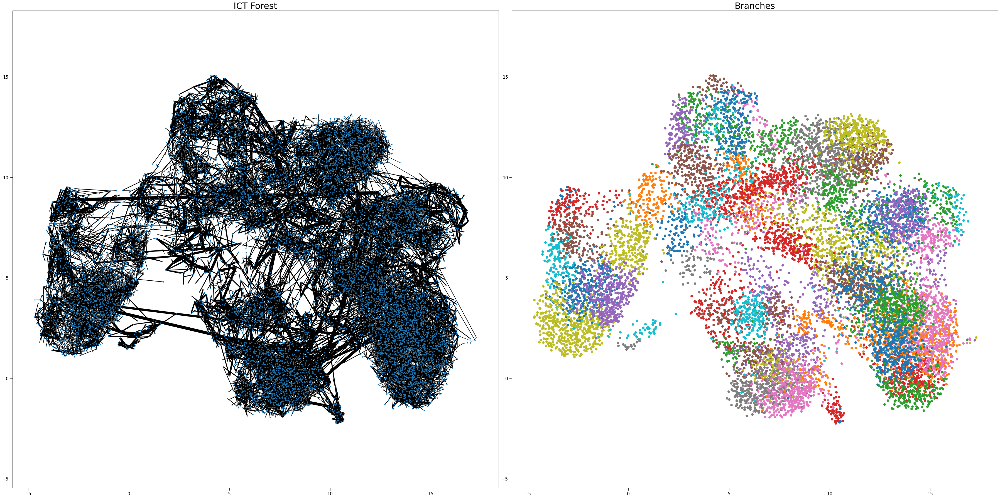

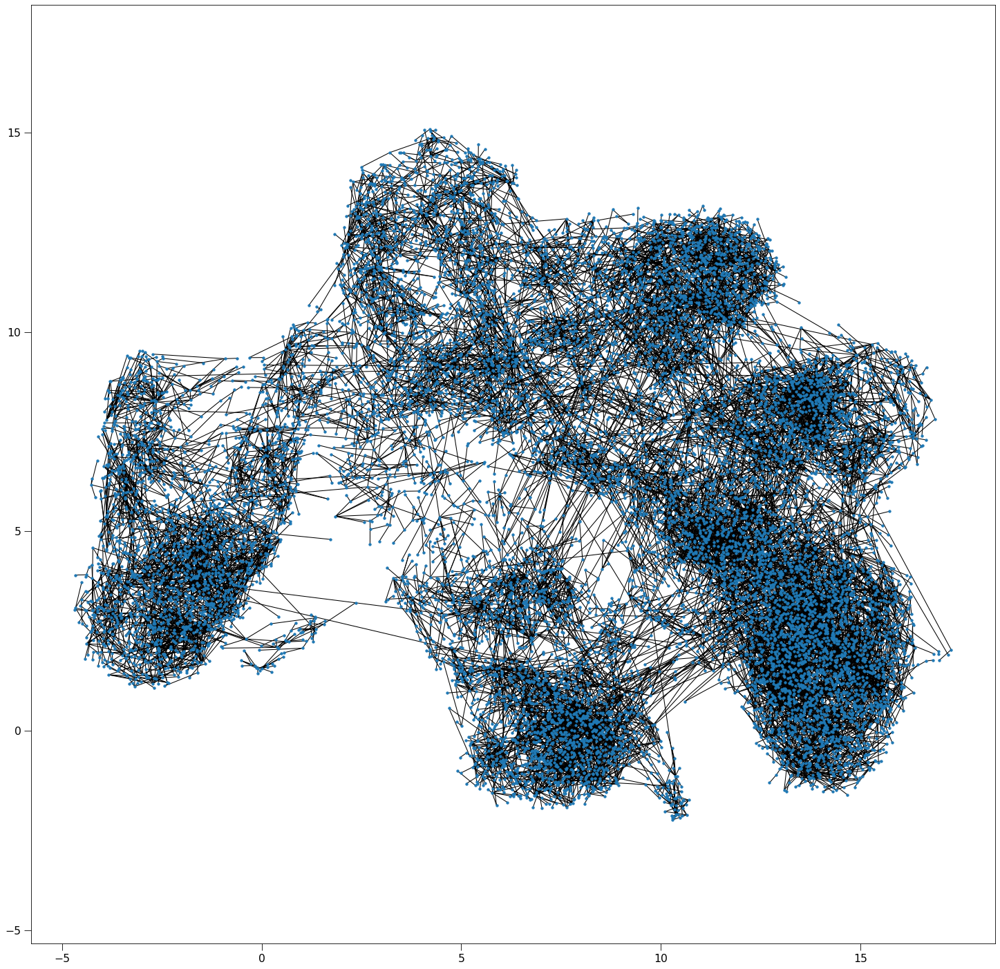

Patching the components together:   0%|          | 0/79 [00:00<?, ?it/s]

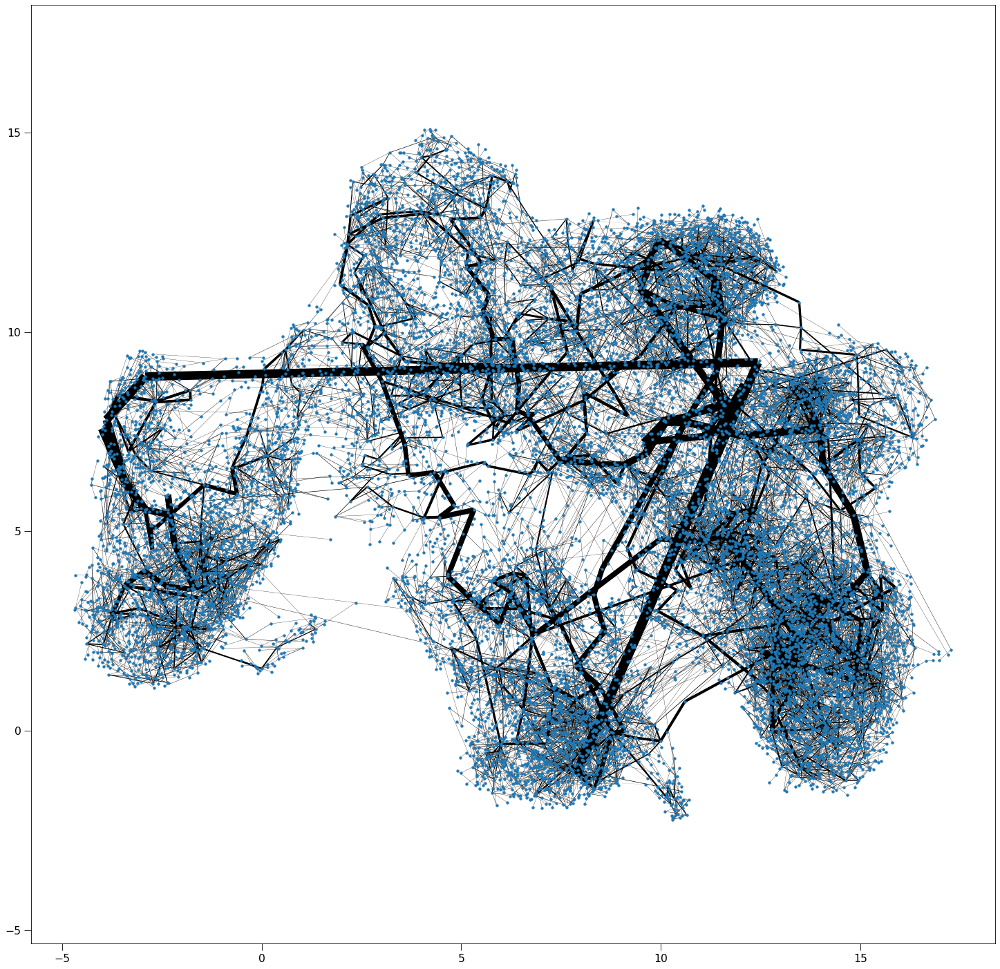

In [9]:
graphs = sub_ICTs
widths = []
for sub_ICT in sub_ICTs:
    if sub_ICT.numberOfNodes() == 1:
        widths.append([])
        continue
    widths.append(compute_widths(sub_ICT))
    
names = ["ICT Forest", "Branches"]

number_of_plots = 2
fig, ax = plt.subplots(1,2, figsize=(24*2,24))

for i, component in enumerate(components):
    nk.viztasks.drawGraph(graphs[i], pos=embedding[component], ax=ax[0], width=widths[i], node_size=10)
            

for component in components:
    ax[1].plot(*embedding[component].T)
    
for i, name in enumerate(names):
    ax[i].set_title(name)
    ax[i].axis("equal")
    ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
    ax[i].set_axis_on()
    
    
plt.tight_layout()
plt.show()

from sklearn.metrics import pairwise_distances

G = nk.graph.Graph(n=len(position), weighted=True)

distances = pairwise_distances(position, position)

for component, sub_ICT in zip(components, sub_ICTs):
    for u, v, w in sub_ICT.iterEdgesWeights():
        nodeA = component[u]
        nodeB = component[v]
        G.addEdge(nodeA, nodeB, distances[nodeA, nodeB])
        
# plot the not connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()


##############################
           # new #           #
##############################
good_edges = []              #
for u, v in G.iterEdges():   #
    good_edges.append([u,v]) #
############################## 


G = patch_together(G, pca, 4)
G.indexEdges()

# plot the connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, width=compute_widths(G), node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

## Cluster ICT

In [10]:
# calculate the cluster ICT with all aim nodes
start = time.time()
ICT = calculate_ICT(G, algorithm_type="cluster_all", cluster_centers=cluster_centers,
                                zeros_stay_zeros=True, update_G=1.1, good_edges=good_edges)
ICT.indexEdges()

create edgeId array:   0%|          | 0/13823 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/13823 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13642 [00:00<?, ?it/s]

update Arr 13823 -> 13651
update Arr 13651 -> 13651
update Arr 13651 -> 13650
update Arr 13650 -> 13650
update Arr 13650 -> 13648
update Arr 13648 -> 13648
update Arr 13648 -> 13648
update Arr 13648 -> 13648
update Arr 13648 -> 13647
update Arr 13647 -> 13647
update Arr 13647 -> 13646
update Arr 13646 -> 13645
update Arr 13645 -> 13644
update Arr 13644 -> 13644
update Arr 13644 -> 13643
update Arr 13643 -> 13642
added 19 edges early


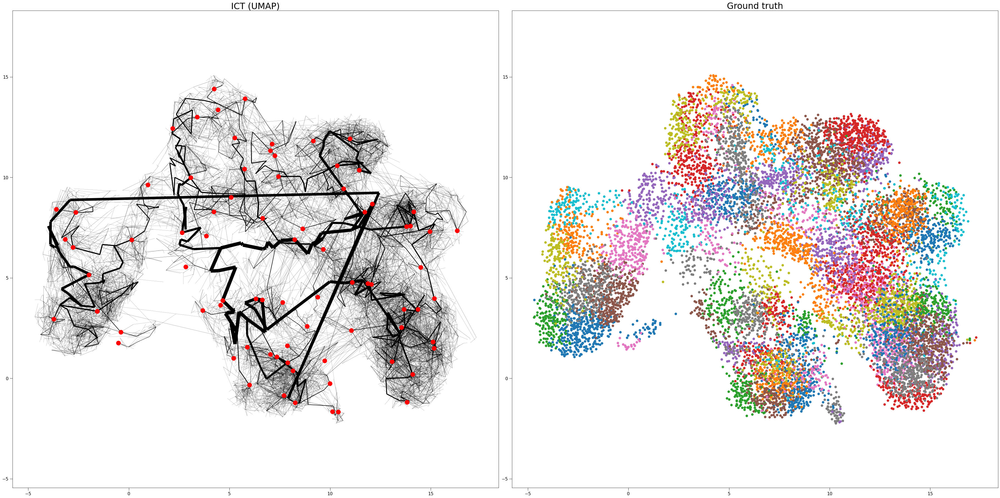

In [11]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))

plot_graph(ICT, embedding, "ICT (UMAP)", ax1, cluster_centers, node_size=0)
plot_points(embedding, "Ground truth", ax2, labels)

ax2.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-UMAP-"+parameters+".png")

plt.show()

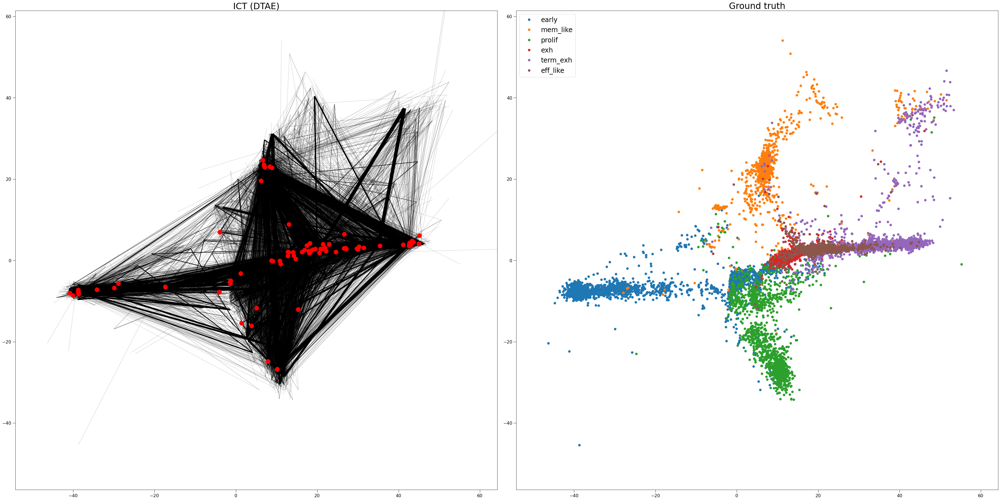

In [12]:
if (dataset == "pancreas_reduced") or (dataset == "pancreas_full") or (dataset=="eth_CC"):
    if dataset == "pancreas_reduced":
        dtae_embedding, dtae_labels = data_loader("pancreas_reduced_DTAE_embedding")
        
    elif dataset == "pancreas_full":
        dtae_embedding, dtae_labels = data_loader("pancreas_full_DTAE_embedding")
        
    elif dataset=="eth_CC":
        dtae_embedding, dtae_labels = data_loader("CC_DTAE_embedding")
    
    else:
        raise RuntimeError("Something went definitively wrong!?")
        
        
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))
    plot_graph(ICT, dtae_embedding, "ICT (DTAE)", ax1, cluster_centers, node_size=0)
    plot_points(dtae_embedding, "Ground truth", ax2, dtae_labels)
    
    if dataset == "eth_CC":
        ax1.set_xlim([-50,60])
        ax2.set_xlim([-50,60])
        ax1.set_ylim([-45,50])
        ax2.set_ylim([-45,50])
    
    plt.tight_layout()
    plt.savefig("./Output/Images/"+dataset+"-DTAE-"+parameters+".png")
    plt.show()

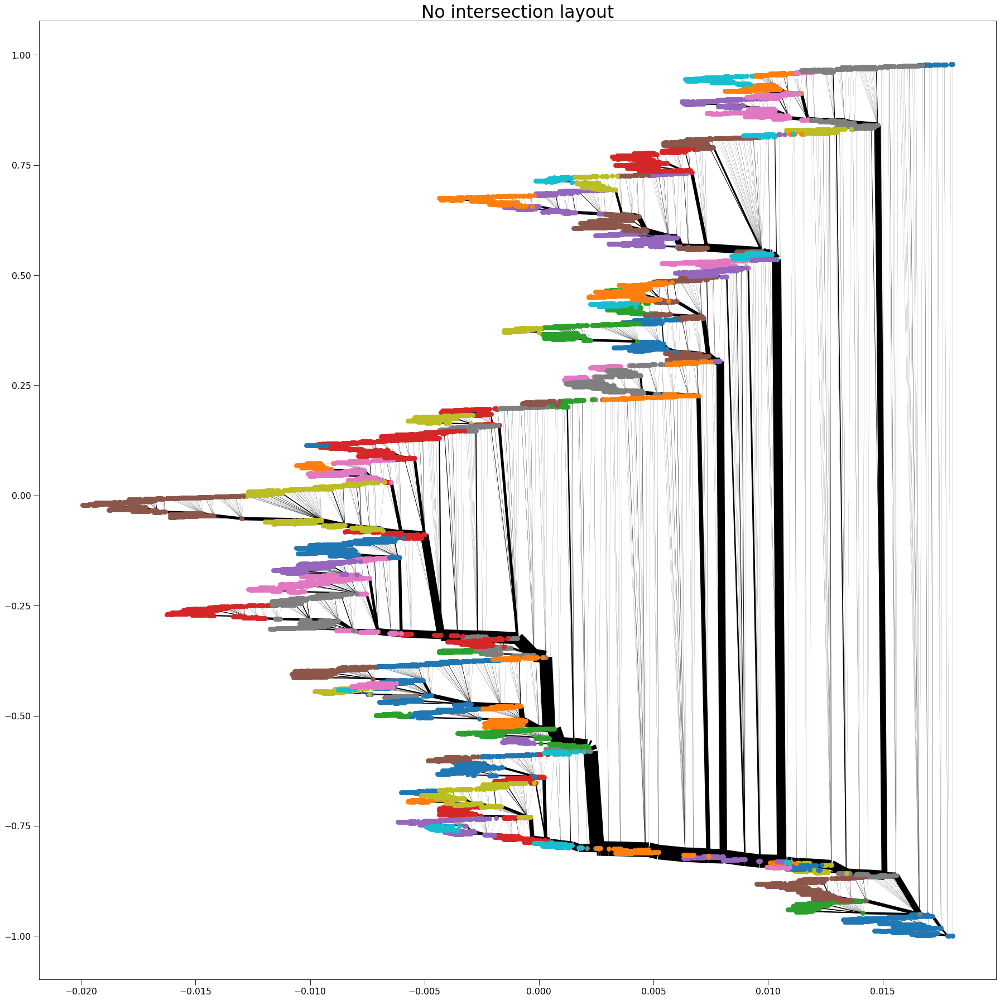

In [13]:
fig, ax = plt.subplots(1, figsize=(24,24))
no_intersections(ICT, embedding, ax, labels)
ax.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-no-intersection-"+parameters+".png")
plt.show()